# Dataset Download and Preprocessing

In [1]:
# Helper function to check whether the dataset exists in the file directory
import os
def get_data():
  if "food-101" in os.listdir('../dataset/'):
    print("Dataset already exists")
  else:
    print("Please ensure that the data is available!")

In [2]:
get_data()

Dataset already exists


In [3]:
# Initialize dataset path
from pathlib import Path
data_dir = Path('../dataset/food-101')

In [4]:
# Check the contents of the dataset folder
dataset = os.listdir(data_dir)
print(dataset)

['food_c101_n1000_r384x384x3.h5', 'food_c101_n10099_r32x32x1.h5', 'food_c101_n10099_r32x32x3.h5', 'food_c101_n10099_r64x64x1.h5', 'food_c101_n10099_r64x64x3.h5', 'food_test_c101_n1000_r128x128x1.h5', 'food_test_c101_n1000_r128x128x3.h5', 'food_test_c101_n1000_r32x32x1.h5', 'food_test_c101_n1000_r32x32x3.h5', 'food_test_c101_n1000_r64x64x1.h5', 'food_test_c101_n1000_r64x64x3.h5', 'images', 'meta', 'test', 'train']


In [5]:
# Check the contents of images folder
image_dir = os.listdir(data_dir / "images")
print(image_dir)

['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheesecake', 'cheese_plate', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_sou

In [6]:
# Check the contents of images folder
meta = os.listdir(data_dir / "meta")
print(meta)

['classes.txt', 'labels.txt', 'test.json', 'test.txt', 'train.json', 'train.txt']


In [7]:
# Helper method to split dataset into train and test folders
# This method takes a file containing file paths as input and copies the corresponding image files from the source directory to the destination directory, organized by class labels.

from shutil import copy
from collections import defaultdict

def prepare_data(filepath, src, dest):
    # Create a defaultdict to store image file paths by class labels
    classes_images = defaultdict(list)

    # Read file paths from the input file
    with open(filepath, 'r') as txt:
        paths = [read.strip() for read in txt.readlines()]
        for p in paths:
            food = p.split('/')
            classes_images[food[0]].append(food[1] + '.jpg')

    # Loop through the class labels and copy image files to destination directory
    for food in classes_images.keys():
        print("\nCopying images into", food)
        if not os.path.exists(os.path.join(dest, food)):
            os.makedirs(os.path.join(dest, food))
        for i in classes_images[food]:
            copy(os.path.join(src, food, i), os.path.join(dest, food, i))
    print("Copying Done!")

In [8]:
# Prepare train dataset by copying images from food-101/images to food-101/train using the file train.txt
print("Creating train data...")
prepare_data('../dataset/food-101/meta/train.txt', '../dataset/food-101/images', '../dataset/food-101/train')

Creating train data...

Copying images into apple_pie

Copying images into baby_back_ribs

Copying images into baklava

Copying images into beef_carpaccio

Copying images into beef_tartare

Copying images into beet_salad

Copying images into beignets

Copying images into bibimbap

Copying images into bread_pudding

Copying images into breakfast_burrito

Copying images into bruschetta

Copying images into caesar_salad

Copying images into cannoli

Copying images into caprese_salad

Copying images into carrot_cake

Copying images into ceviche

Copying images into cheesecake

Copying images into cheese_plate

Copying images into chicken_curry

Copying images into chicken_quesadilla

Copying images into chicken_wings

Copying images into chocolate_cake

Copying images into chocolate_mousse

Copying images into churros

Copying images into clam_chowder

Copying images into club_sandwich

Copying images into crab_cakes

Copying images into creme_brulee

Copying images into croque_madame

Cop

In [9]:
# Prepare test data by copying images from food-101/images to food-101/test using the file test.txt
print("Creating test data...")
prepare_data('../dataset/food-101/meta/test.txt', '../dataset/food-101/images', '../dataset/food-101/test')

Creating test data...

Copying images into apple_pie

Copying images into baby_back_ribs

Copying images into baklava

Copying images into beef_carpaccio

Copying images into beef_tartare

Copying images into beet_salad

Copying images into beignets

Copying images into bibimbap

Copying images into bread_pudding

Copying images into breakfast_burrito

Copying images into bruschetta

Copying images into caesar_salad

Copying images into cannoli

Copying images into caprese_salad

Copying images into carrot_cake

Copying images into ceviche

Copying images into cheesecake

Copying images into cheese_plate

Copying images into chicken_curry

Copying images into chicken_quesadilla

Copying images into chicken_wings

Copying images into chocolate_cake

Copying images into chocolate_mousse

Copying images into churros

Copying images into clam_chowder

Copying images into club_sandwich

Copying images into crab_cakes

Copying images into creme_brulee

Copying images into croque_madame

Copy

In [10]:
# Define the path to the train folder
train_folder = os.path.join(data_dir, "train")

# Count the number of image files in the train folder
num_image_files = 0
for root, dirs, files in os.walk(train_folder):
    for file in files:
        if file.endswith(".jpg"):
            num_image_files += 1

# Print the total number of image files in the train folder
print("Total number of image files in the train folder:", num_image_files)

Total number of image files in the train folder: 75750


In [11]:
# Define the path to the test folder
test_folder = os.path.join(data_dir, "test")

# Count the number of image files in the test folder
num_image_files = 0
for root, dirs, files in os.walk(test_folder):
    for file in files:
        if file.endswith(".jpg"):
            num_image_files += 1

# Print the total number of image files in the test folder
print("Total number of image files in the test folder:", num_image_files)

Total number of image files in the test folder: 25250


In [13]:
# Open the text file in read mode
with open('../dataset/food-101/meta/classes.txt', 'r') as file:
    # Read the lines from the file
    lines = file.readlines()
    # Create an empty array to store the classes
    classes = []
    # Loop through each line
    for line in lines:
        # Remove leading/trailing whitespaces and newline characters
        class_name = line.strip()
        # Append the class name to the array
        classes.append(class_name)

# Sort the 'classes' array alphabetically in ascending order
classes.sort()

# Now the 'classes' array contains the list of classes from the text file
print(classes)

['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_sou

# Data Augmentation and Model Implementation

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
import torch
import torchvision
from torch.utils.tensorboard import SummaryWriter
from torchvision.models.resnet import resnet50

In [15]:
# Define the transformation pipeline for training data
train_transforms = torchvision.transforms.Compose([
        torchvision.transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),  # Apply random color jittering
        torchvision.transforms.RandomAffine(15),  # Apply random affine transformation
        torchvision.transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
        torchvision.transforms.RandomRotation(15),  # Randomly rotate the image
        torchvision.transforms.Resize((224,224)),  # Resize the image to 224x224 pixels
        torchvision.transforms.ToTensor(),  # Convert the image to tensor
        torchvision.transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))  # Normalize the image with specified mean and standard deviation
])

# Define the transformation pipeline for validation data
valid_transforms = torchvision.transforms.Compose([
        torchvision.transforms.Resize((224,224)),  # Resize the image to 224x224 pixels
        torchvision.transforms.ToTensor(),  # Convert the image to tensor
        torchvision.transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))  # Normalize the image with specified mean and standard deviation
])

In [16]:
# Create a training dataset object by loading images from the 'train' folder and applying the 'train_transforms'
train_dataset = torchvision.datasets.ImageFolder(data_dir / 'train', transform=train_transforms)
# Create a validation dataset object by loading images from the 'test' folder and applying the 'valid_transforms'
valid_dataset = torchvision.datasets.ImageFolder(data_dir / 'test', transform=valid_transforms)

In [17]:
# Define the batch size for training and validation data
batch_size = 128
# Create a training data loader by wrapping the 'train_dataset' with DataLoader
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size, shuffle=True, num_workers=2, pin_memory=True)
# Create a validation data loader by wrapping the 'valid_dataset' with DataLoader
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size, shuffle=False, num_workers=2, pin_memory=True)

In [18]:
def visualize_images(dataloader):
    # Define mean and std values for normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    
    # Create a figure with subplots to visualize images
    figure, ax = plt.subplots(nrows=10, ncols=10, figsize=(20, 30))
    
    # Get the list of classes from the dataset
    classes = list(dataloader.dataset.class_to_idx.keys())
    
    # Initialize image counter
    img_no = 0
    
    # Iterate over batches of images and labels from the dataloader
    for images, labels in dataloader:
        for i in range(10):
            for j in range(10):
                # Extract an image and its corresponding label from the batch
                img = np.array(images[img_no]).transpose(1, 2, 0)
                lbl = labels[img_no]

                # Display the image with the label as the title
                ax[i, j].imshow((img * std) + mean)
                ax[i, j].set_title(classes[lbl])
                ax[i, j].set_axis_off()
                img_no += 1
        
        # Break out of the loop after processing the first batch
        break

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

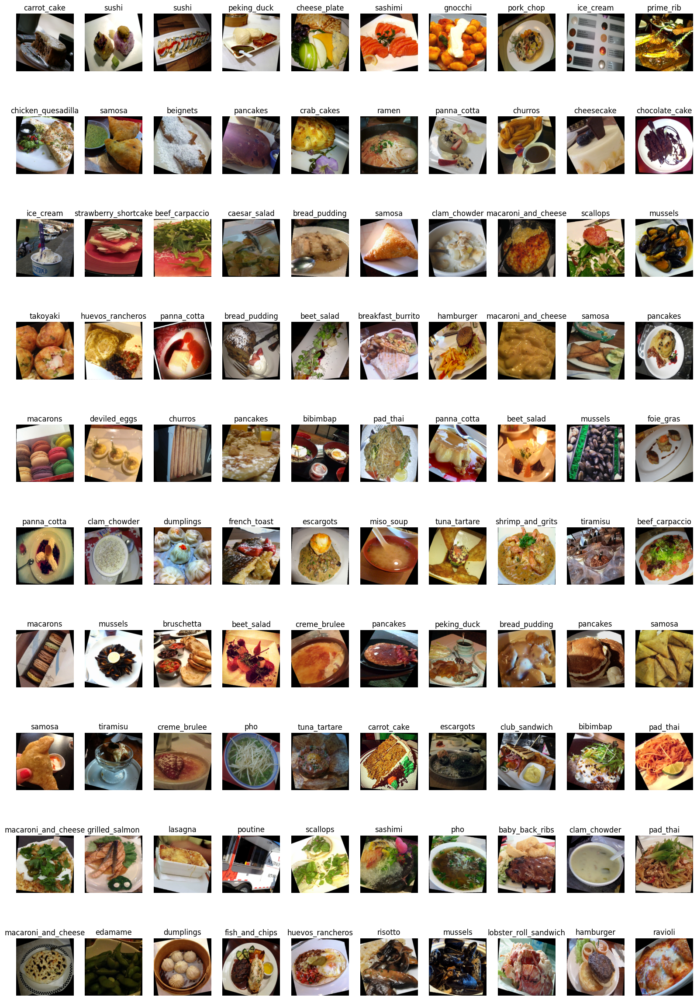

In [19]:
visualize_images(train_loader)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

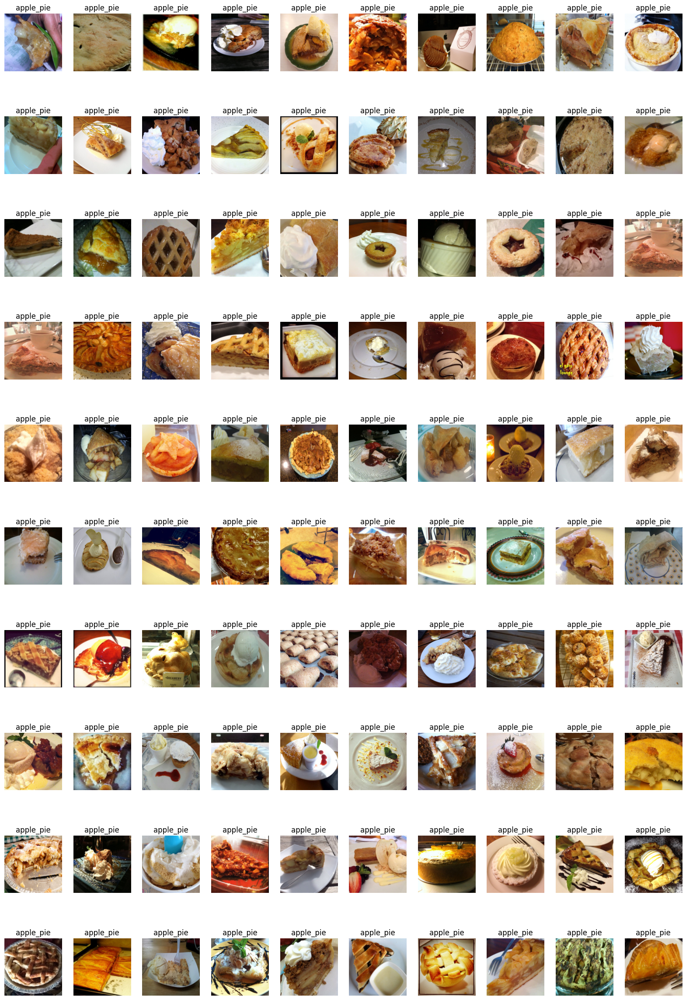

In [20]:
visualize_images(valid_loader)

# Setting up the model

In [31]:
model = resnet50(pretrained=True)

c:\Python39\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
c:\Python39\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [32]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [22]:
# Freeze first few layers of the model by setting `requires_grad` to False
# It can experimented with different values for the threshold (e.g., 100) to freeze different number of layers
for i, param in enumerate(model.parameters()):
    if i < 100:
        param.requires_grad = False

In [23]:
# Define a new fully connected (FC) layer for the model
# The FC layer includes a dropout layer with a dropout rate of 0.5 followed by a linear layer with 2048 input features and 101 output features
model.fc = torch.nn.Sequential(
    torch.nn.Dropout(0.5),
    torch.nn.Linear(2048, 101)
)

# Calculate Learning Rate

  0%|          | 0/25 [00:00<?, ?it/s]

Learning rate search finished. See the graph with {finder_name}.plot()
LR suggestion: steepest gradient
Suggested LR: 3.16E-04


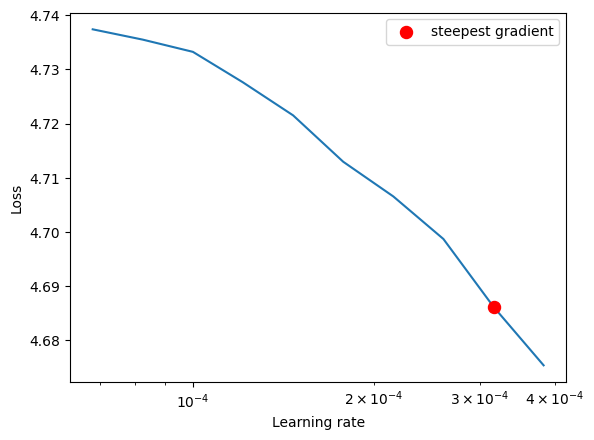

In [24]:
# Importing the necessary modules
from torch_lr_finder import LRFinder
import torch.nn as nn
import torch.optim as optim

# Define the loss function
criterion = nn.CrossEntropyLoss()
# Define the optimizer with a learning rate of 0.00001
optimizer = optim.Adam(model.parameters(), lr=0.00001)
# Create an instance of LRFinder with the model, optimizer, and criterion
lr_finder = LRFinder(model, optimizer, criterion, device="cuda")
# Perform a range test to find optimal learning rates
lr_finder.range_test(train_loader, end_lr=0.001, num_iter=25)
# Plot the results of the range test
lr_finder.plot()
# Reset the LR Finder for future use
lr_finder.reset()

# Model Training

In [25]:
cuda = True  # Boolean flag indicating whether to use GPU (True) or CPU (False) for training
epochs = 10  # Number of epochs for training
model_name = '../model/resnet50.pt'  # File path to save the trained model
optimizer = torch.optim.Adam(model.parameters(),lr=4e-5,weight_decay=0.001)  # Adam optimizer for model parameters with specified learning rate and weight decay
criterion = torch.nn.CrossEntropyLoss()  # CrossEntropyLoss as the criterion for model training
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min',factor=0.1,patience=1,verbose=True)  # Learning rate scheduler to reduce learning rate on plateau

writer = SummaryWriter()  # Tensorboard summary writer for logging training progress
early_stop_count=0  # Counter for early stopping
ES_patience=5  # Number of epochs to wait for early stopping
best = 0.0  # Variable to store the best validation accuracy achieved during training

if cuda:
    model.cuda()  # Move the model to GPU if cuda is set to True

for epoch in range(epochs):
    
    # Training
    model.train()  # Set the model to training mode
    correct = 0  # Counter for correct predictions
    train_loss = 0.0  # Accumulator for training loss
    tbar = tqdm(train_loader, desc = 'Training', position=0, leave=True)  # Progress bar for training data loader
    for i,(inp,lbl) in enumerate(tbar):
        optimizer.zero_grad()  # Zero the gradients of optimizer
        if cuda:
            inp,lbl = inp.cuda(),lbl.cuda()  # Move input and label tensors to GPU if cuda is set to True
        out = model(inp)  # Forward pass
        loss = criterion(out,lbl)  # Compute loss
        train_loss += loss  # Accumulate training loss
        out = out.argmax(dim=1)  # Compute predicted labels
        correct += (out == lbl).sum().item()  # Count correct predictions
        loss.backward()  # Backward pass
        optimizer.step()  # Update model parameters
        tbar.set_description(f"Epoch: {epoch+1}, loss: {loss.item():.5f}, acc: {100.0*correct/((i+1)*train_loader.batch_size):.4f}%")  # Update progress bar with current epoch, loss, and accuracy
    train_acc = 100.0*correct/len(train_loader.dataset)  # Compute training accuracy
    train_loss /= (len(train_loader.dataset)/batch_size)  # Average training loss per batch

    # Validation
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        correct = 0  # Counter for correct predictions
        val_loss = 0.0  # Accumulator for validation loss
        vbar = tqdm(valid_loader, desc = 'Validation', position=0, leave=True)  # Progress bar for validation data loader
        for i,(inp,lbl) in enumerate(vbar):
            if cuda:
                inp,lbl = inp.cuda(),lbl.cuda()  # Move input and label tensors to GPU if cuda is set to True
            out = model(inp)  # Forward pass
            val_loss += criterion(out,lbl)  # Compute loss
            out = out.argmax(dim=1)  # Compute predicted labels
            correct += (out == lbl).sum().item()  # Update correct predictions counter
        val_acc = 100.0*correct/len(valid_loader.dataset)  # Compute validation accuracy
        val_loss /= (len(valid_loader.dataset)/batch_size)  # Normalize validation loss by batch size
    print(f'\nEpoch: {epoch+1}/{epochs}')
    print(f'Train loss: {train_loss}, Train Accuracy: {train_acc}')
    print(f'Validation loss: {val_loss}, Validation Accuracy: {val_acc}\n')

    scheduler.step(val_loss)  # Update scheduler with validation loss

    # Write validation results to TensorBoard
    writer.add_scalar("Loss/train", train_loss, epoch)
    writer.add_scalar("Loss/val", val_loss, epoch)
    writer.add_scalar("Accuracy/train", train_acc, epoch)
    writer.add_scalar("Accuracy/val", val_acc, epoch)

    # Check if validation accuracy has improved
    if val_acc>best:
        best=val_acc
        torch.save(model,model_name)  # Save model if accuracy improved
        early_stop_count = 0  # Reset early stopping counter
        print('Accuracy Improved, model saved.\n')
    else:
        early_stop_count += 1  # Increase early stopping counter

    # Check for early stopping
    if early_stop_count == ES_patience:
        print('Early Stopping Initiated...')
        print(f'Best Accuracy achieved: {best:.2f}% at epoch: {epoch - ES_patience}')
        print(f'Model saved as {model_name}')
        break
    
    writer.flush()
# writer.close()

Validation: 100%|████████████████████████████████████████████████████████████████████| 198/198 [16:22<00:00,  4.96s/it]



Epoch: 1/10
Train loss: 2.6961209774017334, Train Accuracy: 41.34653465346535
Validation loss: 1.3378214836120605, Validation Accuracy: 68.40396039603961

Accuracy Improved, model saved.



Validation: 100%|████████████████████████████████████████████████████████████████████| 198/198 [16:20<00:00,  4.95s/it]



Epoch: 2/10
Train loss: 1.3884837627410889, Train Accuracy: 65.88514851485148
Validation loss: 0.9549726247787476, Validation Accuracy: 75.46534653465346

Accuracy Improved, model saved.



Validation: 100%|████████████████████████████████████████████████████████████████████| 198/198 [16:21<00:00,  4.96s/it]



Epoch: 3/10
Train loss: 1.0642707347869873, Train Accuracy: 73.05874587458746
Validation loss: 0.8218684792518616, Validation Accuracy: 78.34059405940594

Accuracy Improved, model saved.



Validation: 100%|████████████████████████████████████████████████████████████████████| 198/198 [16:16<00:00,  4.93s/it]



Epoch: 4/10
Train loss: 0.8774093389511108, Train Accuracy: 77.49570957095709
Validation loss: 0.7643807530403137, Validation Accuracy: 79.86138613861387

Accuracy Improved, model saved.



Validation: 100%|████████████████████████████████████████████████████████████████████| 198/198 [16:18<00:00,  4.94s/it]



Epoch: 5/10
Train loss: 0.7438735961914062, Train Accuracy: 80.76435643564356
Validation loss: 0.7401655912399292, Validation Accuracy: 80.28910891089109

Accuracy Improved, model saved.



Validation: 100%|████████████████████████████████████████████████████████████████████| 198/198 [16:20<00:00,  4.95s/it]



Epoch: 6/10
Train loss: 0.6396448612213135, Train Accuracy: 83.39669966996699
Validation loss: 0.7139801979064941, Validation Accuracy: 80.6891089108911

Accuracy Improved, model saved.



Validation: 100%|████████████████████████████████████████████████████████████████████| 198/198 [16:20<00:00,  4.95s/it]



Epoch: 7/10
Train loss: 0.5472064018249512, Train Accuracy: 85.7980198019802
Validation loss: 0.6980665922164917, Validation Accuracy: 81.10495049504951

Accuracy Improved, model saved.



Validation: 100%|████████████████████████████████████████████████████████████████████| 198/198 [16:24<00:00,  4.97s/it]



Epoch: 8/10
Train loss: 0.47505348920822144, Train Accuracy: 87.66072607260726
Validation loss: 0.721496045589447, Validation Accuracy: 80.74851485148515



Validation: 100%|████████████████████████████████████████████████████████████████████| 198/198 [16:20<00:00,  4.95s/it]



Epoch: 9/10
Train loss: 0.4068138003349304, Train Accuracy: 89.58811881188119
Validation loss: 0.7043620944023132, Validation Accuracy: 81.10891089108911

Epoch 00009: reducing learning rate of group 0 to 4.0000e-06.
Accuracy Improved, model saved.



Validation: 100%|████████████████████████████████████████████████████████████████████| 198/198 [17:03<00:00,  5.17s/it]



Epoch: 10/10
Train loss: 0.29044297337532043, Train Accuracy: 93.04422442244224
Validation loss: 0.6462433934211731, Validation Accuracy: 82.76831683168317

Accuracy Improved, model saved.



# Result Analysis

In [1]:
# Reload the TensorBoard extension in the IPython environment
%reload_ext tensorboard
# Launch TensorBoard with the 'runs' directory specified as the log directory
%tensorboard --logdir runs

# Save and Load Model

In [33]:
import pickle

In [27]:
# Set the device to CUDA (GPU) if available, otherwise set it to CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [28]:
# Save the state dictionary of the model to the specified file path
torch.save(model.state_dict(), "../model/model.pth")

In [31]:
# After training the model, serialize and save it to a file using pickle
with open('../model/model.pkl', 'wb') as f:
    pickle.dump(model, f)

In [22]:
# Load the pickle file
with open('../model/model.pkl', 'rb') as f:
    model = pickle.load(f)

In [ ]:
# Load the state dictionary of the model from the specified file path, mapping it to CPU
model.load_state_dict(torch.load("../model/model.pth", map_location='cpu'))

# Set the model to evaluation mode
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

# Testing and Evaluation

In [23]:
# Process the image
def process_image(image_path):
    # Load Image
    img = Image.open(image_path)
    
    # Get the dimensions of the image
    width, height = img.size
    
    # Resize the image while maintaining the aspect ratio, with the shorter side resized to 255 pixels
    img = img.resize((255, int(255*(height/width))) if width < height else (int(255*(width/height)), 255))
    
    # Get the dimensions of the new image size
    width, height = img.size
    
    # Set the coordinates to do a center crop of 224 x 224
    left = (width - 224)/2
    top = (height - 224)/2
    right = (width + 224)/2
    bottom = (height + 224)/2
    img = img.crop((left, top, right, bottom))
    
    # Turn image into numpy array
    img = np.array(img)
    
    # Make the color channel dimension first instead of last
    img = img.transpose((2, 0, 1))
    
    # Make all values between 0 and 1
    img = img/255
    
    # Normalize the image based on preset mean and standard deviation values
    img[0] = (img[0] - 0.485)/0.229
    img[1] = (img[1] - 0.456)/0.224
    img[2] = (img[2] - 0.406)/0.225
    
    # Add a fourth dimension to the beginning to indicate batch size
    img = img[np.newaxis,:]
    
    # Turn into a torch tensor
    image = torch.from_numpy(img)
    image = image.float()
    return image

In [24]:
# Using the model to predict the label
def predict(image, model):
    # Pass the image through the model
    image = image.to('cpu')
    output = model(image)
    
    # Reverse the log transformation in the output by exponentiation of the tensor
    output = torch.exp(output)
    
    # Get the top predicted class index, and the corresponding predicted probability
    probs, classes = output.topk(1, dim=1)
    # Limit the predicted probability to a maximum of 100, if it exceeds 100
    return 100 if probs.item()>100 else probs.item(), classes.item()

In [25]:
# Show Image
def show_image(image):
    # Convert image tensor to NumPy array
    image = image.numpy()
    
    # Un-normalize the image by multiplying with a scale factor and adding an offset
    image[0] = image[0] * 0.226 + 0.445
    
    # Create a new Matplotlib figure with a specific size of (25, 4) inches
    fig = plt.figure(figsize=(25, 4))
    # Display the image using plt.imshow()
    plt.imshow(np.transpose(image[0], (1, 2, 0)))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The model is  100 % certain that the image is baklava


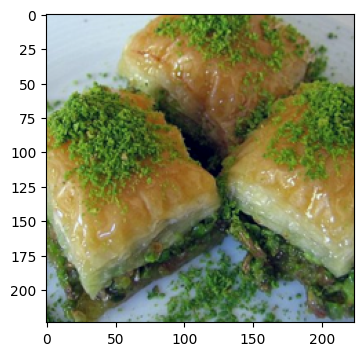

In [30]:
# Process Image
# Load and preprocess the image
# image = process_image("../examples/food/pizza.jpeg)
image = process_image("../examples/food/baklava.jpeg")

# Pass the preprocessed image to the model for prediction
top_prob, top_class = predict(image, model)

# Show the original image
show_image(image)

# Determine the predicted class label
# If the predicted class is within the range of 0-101, use the class label from the list of food classes
# Otherwise, assign "non_food" as the predicted class label
if top_class in range(0,102):
  c = classes[top_class]
else:
  c = "non_food"

# Print the prediction results
print("The model is ", top_prob, "% certain that the image is", c  )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The model is  8.138598442077637 % certain that the image is  non_food


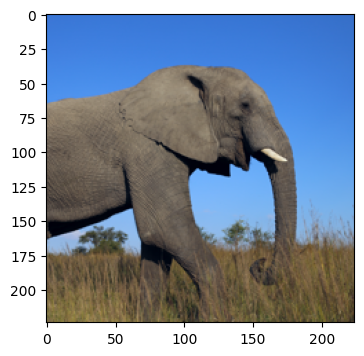

In [28]:
# Process Image
# Load and preprocess the image
# image = process_image("../examples/non_food/table.jpg")
image = process_image("../examples/non_food/elephant.jpg")

# Pass the preprocessed image to the model for prediction
top_prob, top_class = predict(image, model)

# Show the original image
show_image(image)

# Determine the predicted class label
# If the predicted class is within the range of 0-101 and the prediction probability is greater than 50%,
# use the class label from the list of food classes
# Otherwise, assign "non_food" as the predicted class label
if top_class in range(0,102) and top_prob>50:
  c = classes[top_class]
else:
  c = "non_food"

# Print the prediction results
print("The model is ", top_prob, "% certain that the image is", c  )